In [15]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Load elo ratings dataframe
elo_df = pd.read_pickle("../data/processed/elo_ratings.pkl")

In [2]:
from pathlib import Path

# paths
out_path = Path("../outputs/tables/peak_elo_ratings.md")
out_path.parent.mkdir(parents=True, exist_ok=True)

# build table of peak elos
peak_elo = (
    elo_df.groupby("fighter")["elo"]
    .max()
    .sort_values(ascending=False)
    .round(2)
    .rename("max_elo")
)

peak_elo_df = (
    peak_elo.reset_index()                    
            .head(30)
)

#add rank column
peak_elo_df['rank'] = peak_elo_df['max_elo'].rank(method='first', ascending=False).astype(int)

#sort by rank
peak_elo_df = peak_elo_df.sort_values('rank')

#split into two columns
left = peak_elo_df.iloc[:15][['rank', 'fighter', 'max_elo']].reset_index(drop=True)
right = peak_elo_df.iloc[15:][['rank', 'fighter', 'max_elo']].reset_index(drop=True)

#combine side by side
table = pd.concat([left, right], axis=1)

table.columns = ['Rank', 'Fighter', 'Peak ELO Rating', 'Rank', 'Fighter', 'Peak ELO Rating']

peak_elo_md = table.to_markdown(index=False)

# write as UTF-8
out_path.write_text(peak_elo_md, encoding="utf-8")



1869

In [3]:
# Table of top final elos with activity in last 2 years
recent_date = elo_df['date'].max() - pd.DateOffset(years=2)
final_elos = (
    elo_df.sort_values('date')
           .groupby('fighter')['elo']
           .last()
           .sort_values(ascending=False)
           .round(2)
           .rename('current_elo')
)
recent_fighters = elo_df[elo_df['date'] >= recent_date]['fighter'].unique()
recent_final_elos = final_elos[final_elos.index.isin(recent_fighters)]
print(recent_final_elos.head(30))

# paths
out_path = Path("../outputs/tables/current_rankings.md")
out_path.parent.mkdir(parents=True, exist_ok=True)


current_rankings_df = (
    recent_final_elos.reset_index()                   
            .head(30)
)

#add rank column
current_rankings_df['rank'] = current_rankings_df['current_elo'].rank(method='first', ascending=False).astype(int)

#sort by rank
current_rankings_df = current_rankings_df.sort_values('rank')

#split into two columns
left2 = current_rankings_df.iloc[:15][['rank', 'fighter', 'current_elo']].reset_index(drop=True)
right2 = current_rankings_df.iloc[15:][['rank', 'fighter', 'current_elo']].reset_index(drop=True)

#combine side by side
table2 = pd.concat([left2, right2], axis=1)

table2.columns = ['Rank', 'Fighter', 'ELO Rating', 'Rank', 'Fighter', 'ELO Rating']

current_rankings_md = table2.to_markdown(index=False)

# write as UTF-8
out_path.write_text(current_rankings_md, encoding="utf-8")

fighter
Islam Makhachev          2035.44
Max Holloway             1927.85
Charles Oliveira         1917.56
Valentina Shevchenko     1916.61
Merab Dvalishvili        1914.80
Justin Gaethje           1889.06
Ilia Topuria             1882.59
Alexander Volkanovski    1878.22
Alex Pereira             1871.46
Jon Jones                1864.55
Dricus du Plessis        1854.68
Magomed Ankalaev         1853.91
Arman Tsarukyan          1853.06
Aljamain Sterling        1852.78
Belal Muhammad           1851.51
Shavkat Rakhmonov        1851.42
Jiří Procházka           1848.28
Alexander Volkov         1847.14
Ryan Bader               1841.42
Alexandre Pantoja        1840.76
Kamaru Usman             1840.54
Zhang Weili              1838.97
Khamzat Chimaev          1835.12
Cris Cyborg              1833.32
Vadim Nemkov             1828.87
Dustin Poirier           1828.13
Corey Anderson           1824.57
Movsar Evloev            1814.27
Francis Ngannou          1808.74
Ciryl Gane               1808.23
Na

1597

In [4]:
print(elo_df["elo"].describe())

count    89576.000000
mean      1434.328114
std        181.196800
min       1062.830811
25%       1264.163040
50%       1490.662029
75%       1550.105752
max       2077.165165
Name: elo, dtype: float64


In [5]:
# Best Fights of All Time
# Step 1: Prepare two mirrored DataFrames
df1 = elo_df[['date', 'fighter', 'opponent', 'elo_pre']].copy()

df2 = df1.rename(columns={
    'fighter': 'opponent',
    'opponent': 'fighter',
    'elo_pre': 'opponent_elo_pre'
})

# Step 2: Merge to get both fighter's elo_pre in the same row
merged = pd.merge(df1, df2, on=['date', 'fighter', 'opponent'])

# Step 3: Create unordered fighter pair to remove mirrored duplicates
merged['fighter_pair'] = merged.apply(
    lambda x: tuple(sorted([x['fighter'], x['opponent']])),
    axis=1
)

# Step 4: Drop duplicated fights based on date and unordered pair
merged_unique = merged.drop_duplicates(subset=['date', 'fighter_pair']).drop(columns='fighter_pair')

# Step 5: Calculate combined Elo before fight
merged_unique['combined_elo_pre'] = merged_unique['elo_pre'] + merged_unique['opponent_elo_pre']

# Step 6: Sort and view top fights
top_combined = merged_unique.sort_values(by='combined_elo_pre', ascending=False)

# Optional: Select columns to view
top_combined = top_combined[['date', 'fighter', 'elo_pre', 'opponent', 'opponent_elo_pre', 'combined_elo_pre']]

print(top_combined.head(20))

top_fights_df = (
    top_combined.loc[:, ['fighter', 'elo_pre', 'opponent', 'opponent_elo_pre', 'combined_elo_pre']]
            .rename(columns={
                "fighter": "Fighter 1",
                "elo_pre": "ELO Rating 1",
                "opponent": "Fighter 2",
                "opponent_elo_pre": "ELO Rating 2",
                "combined_elo_pre": "Combined ELO Rating"})                    
            .reset_index(drop=True)
            .head(10)
)

# ✅ Add ranking column (1 to 10)
top_fights_df.insert(0, "Rank", range(1, len(top_fights_df) + 1))

# Save as markdown table
# paths
out_path = Path("../outputs/tables/best_fights_of_all_time.md")
out_path.parent.mkdir(parents=True, exist_ok=True)

top_fights_md = top_fights_df.to_markdown(index=False)

# write as UTF-8
out_path.write_text(top_fights_md, encoding="utf-8")


            date                fighter      elo_pre               opponent  \
75971 2019-08-17         Daniel Cormier  2053.228685           Stipe Miocic   
71887 2018-07-07           Stipe Miocic  1935.604741         Daniel Cormier   
78236 2020-08-15           Stipe Miocic  1926.221579         Daniel Cormier   
40207 2011-04-30           Jake Shields  1894.114254      Georges St-Pierre   
46020 2012-07-07           Chael Sonnen  1845.486360         Anderson Silva   
85851 2023-10-21  Alexander Volkanovski  1950.654870        Islam Makhachev   
57332 2015-01-03              Jon Jones  1994.766618         Daniel Cormier   
86957 2024-06-01         Dustin Poirier  1898.035044        Islam Makhachev   
66908 2017-04-08         Daniel Cormier  1956.092059        Anthony Johnson   
29259 2009-01-24        Andrei Arlovski  1813.392969      Fedor Emelianenko   
52299 2013-11-16        Johny Hendricks  1845.430362      Georges St-Pierre   
73150 2018-11-03         Daniel Cormier  2034.917847

1355

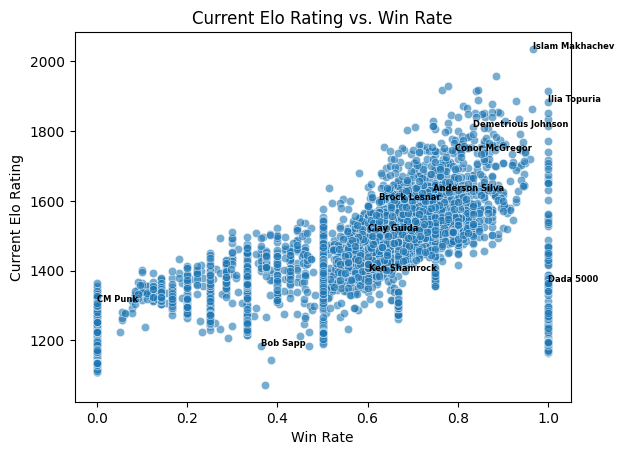

In [6]:
#Plot Elo Rating with Win Rates
# Create win rates
elo_df = elo_df.sort_values(['fighter', 'date'])

fighter_stats = elo_df.groupby('fighter').agg(
    wins=('result', lambda x: (x == 'win').sum()),
    total=('result', 'count')
)
fighter_stats['win_rate'] = fighter_stats['wins'] / fighter_stats['total']

# Merge with Elo
fighter_stats = fighter_stats.merge(final_elos, left_index=True, right_index=True)

# Scatterplot
import seaborn as sns

# Fighters you want to label (use exact names from your dataset)
highlighted = ['Anderson Silva', 'Demetrious Johnson', 'Clay Guida', 'Conor McGregor', 'Bob Sapp', 'Brock Lesnar', 'Dada 5000', 'Ilia Topuria', 'CM Punk', 'Islam Makhachev', 'Ken Shamrock']

for name in highlighted:
    if name in fighter_stats.index:
        row = fighter_stats.loc[name]
        plt.text(row['win_rate'], row['current_elo'], name, fontsize=6, weight='semibold')

sns.scatterplot(data=fighter_stats, x='win_rate', y='current_elo', alpha=0.6)
plt.title("Current Elo Rating vs. Win Rate")
plt.xlabel("Win Rate")
plt.ylabel("Current Elo Rating")
plt.savefig("../outputs/figures/elo_vs_win_rate.png")
plt.show()

In [7]:
from matplotlib.dates import DateFormatter, YearLocator

def plot_multiple_elo_trajectories(fighter_names):

    plt.figure(figsize=(14, 7))
    colors = sns.color_palette("husl", len(fighter_names))

    for fighter, color in zip(fighter_names, colors):
        fighter_data = elo_df[elo_df['fighter'] == fighter].sort_values(by='date')

        if fighter_data.empty:
            print(f"No data found for: {fighter}")
            continue

        # Plot line (light) and scatter (emphasis on fights)
        plt.plot(fighter_data['date'], fighter_data['elo'], color=color, alpha=0.4)
        plt.scatter(fighter_data['date'], fighter_data['elo'], color=color, label=fighter, s=45)

        # Highlight peak Elo
        peak_idx = fighter_data['elo'].idxmax()
        plt.scatter(
            fighter_data.loc[peak_idx, 'date'],
            fighter_data.loc[peak_idx, 'elo'],
            color=color,
            edgecolor='black',
            s=120,
            zorder=5
        )

        plt.text(
            fighter_data.loc[peak_idx, 'date'],
            fighter_data.loc[peak_idx, 'elo'] + 5,
            f"{fighter_data.loc[peak_idx, 'elo']:.0f}",
            fontsize=9,
            ha='center'
        )

    plt.title("Elo Rating Trajectories", fontsize=16, weight='bold')
    plt.xlabel("Year", fontsize=13)
    plt.ylabel("Elo Rating", fontsize=13)

    # ✅ Force ticks to be at whole years
    ax = plt.gca()
    ax.xaxis.set_major_locator(YearLocator(2))          # 1 tick per year
    ax.xaxis.set_major_formatter(DateFormatter("%Y"))  # Format label as just the year

    plt.xticks(rotation=0)  # keep them horizontal now that they're clean
    plt.grid(alpha=0.25)

    # Move legend outside figure
    plt.legend(loc="center left", bbox_to_anchor=(1, 0.5), frameon=False)

    plt.tight_layout()
    plt.savefig("../outputs/figures/elo_trajectories.png")
    plt.show()


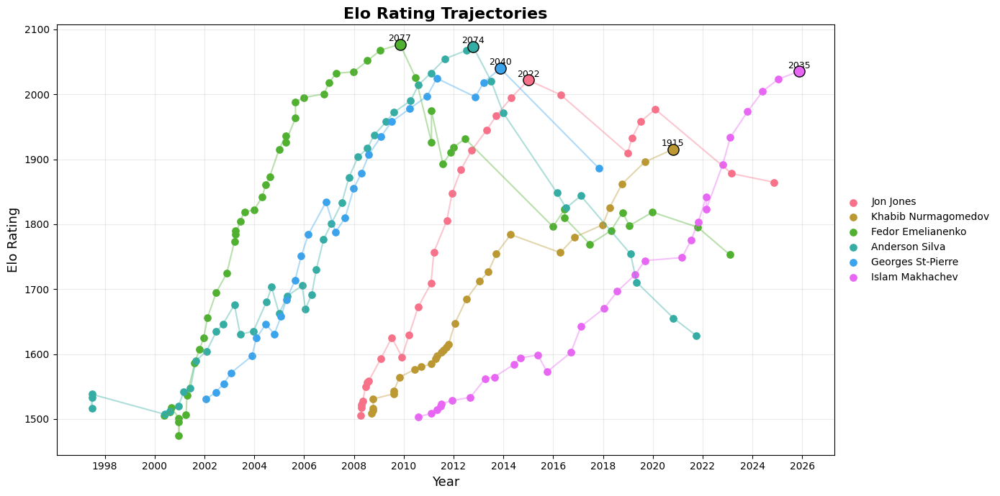

In [8]:
plot_multiple_elo_trajectories(
    ["Jon Jones", "Khabib Nurmagomedov", "Fedor Emelianenko",
     "Anderson Silva", "Georges St-Pierre", "Islam Makhachev"]
)


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def animate_elo(fighter_names, rating_col=None, df=None, interval=150):
    """
    Animates Elo progression over time for the given fighters.
    - fighter_names: list of names
    - rating_col: 'elo' (post-fight) or 'elo_pre' (pre-fight). If None, auto-picks.
    - df: DataFrame to use (defaults to one_row_df)
    """
    if df is None:
        df = elo_df  # assumes you built this earlier (one row per bout)

    # Pick rating column automatically
    if rating_col is None:
        rating_col = 'elo' if 'elo' in df.columns else 'elo_pre'
    assert {'fighter','date',rating_col}.issubset(df.columns), "Missing columns in df"

    # Ensure datetime
    df = df.copy()
    df['date'] = pd.to_datetime(df['date'])

    # Pre-split data per fighter & union of all fight dates
    per_fighter = {}
    for f in fighter_names:
        d = df[df['fighter'] == f].sort_values('date')[['date', rating_col]]
        per_fighter[f] = d

    # If names don’t match exactly you’ll get empties
    # (print a quick diagnostic)
    for f in fighter_names:
        print(f"{f}: {len(per_fighter[f])} fights in data")

    # Build a global sorted date sequence across these fighters
    all_dates = pd.concat([per_fighter[f]['date'] for f in fighter_names if not per_fighter[f].empty],
                          axis=0).drop_duplicates().sort_values().to_list()
    if not all_dates:
        raise ValueError("No dates found for the selected fighters.")

    # Figure + lines
    fig, ax = plt.subplots(figsize=(14, 7))
    try:
        import seaborn as sns
        colors = sns.color_palette("tab10", len(fighter_names))
    except Exception:
        colors = plt.get_cmap('tab10')(range(len(fighter_names)))

    lines = {}
    for f, c in zip(fighter_names, colors):
        line, = ax.plot([], [], label=f, color=c, lw=2)
        lines[f] = line

    # Axes limits
    ymin = df[rating_col].min() - 25
    ymax = df[rating_col].max() + 25
    ax.set_xlim(all_dates[0], all_dates[-1])
    ax.set_ylim(ymin, ymax)
    ax.set_title(f"Elo Rating Trajectories", fontsize=16, weight='bold')
    ax.set_xlabel("Date"); ax.set_ylabel("Elo Rating")
    ax.grid(alpha=0.25)
    ax.legend(loc="center left", bbox_to_anchor=(1,0.5), frameon=False)
    fig.autofmt_xdate()

    # Update function
    def update(i):
        current_date = all_dates[i]
        for f in fighter_names:
            d = per_fighter[f]
            if d.empty:
                continue
            mask = d['date'] <= current_date
            x = d.loc[mask, 'date'].values
            y = d.loc[mask, rating_col].values
            lines[f].set_data(x, y)
        return tuple(lines.values())

    anim = FuncAnimation(fig, update, frames=len(all_dates), interval=interval, blit=False, repeat=False)
    plt.close(fig)  # prevents duplicate static figure
    return anim


In [10]:
anim = animate_elo(["Jon Jones", "Khabib Nurmagomedov", "Fedor Emelianenko",
     "Anderson Silva", "Georges St-Pierre", "Islam Makhachev"], rating_col="elo")
from IPython.display import HTML
HTML(anim.to_jshtml())   # renders inline


Jon Jones: 29 fights in data
Khabib Nurmagomedov: 29 fights in data
Fedor Emelianenko: 53 fights in data
Anderson Silva: 47 fights in data
Georges St-Pierre: 28 fights in data
Islam Makhachev: 30 fights in data


In [11]:
anim = animate_elo(["Jon Jones", "Khabib Nurmagomedov", "Fedor Emelianenko",
     "Anderson Silva", "Georges St-Pierre", "Islam Makhachev"], rating_col="elo")
anim.save("../outputs/figures/elo_animation.gif", writer="pillow", fps=10)

Jon Jones: 29 fights in data
Khabib Nurmagomedov: 29 fights in data
Fedor Emelianenko: 53 fights in data
Anderson Silva: 47 fights in data
Georges St-Pierre: 28 fights in data
Islam Makhachev: 30 fights in data


In [12]:
# Create list of greatest gains/losses in Elo ratings
elo_df['elo_diff'] = elo_df['elo'] - elo_df['elo_pre']
greatest_gains = elo_df.nlargest(10, 'elo_diff')[['fighter', 'opponent', 'date', 'elo_diff']]
greatest_losses = elo_df.nsmallest(10, 'elo_diff')[['fighter', 'opponent', 'date', 'elo_diff']] 
print("Greatest Gains:")
print(greatest_gains)
print("Greatest Losses:")
print(greatest_losses)

Greatest Gains:
                  fighter            opponent       date   elo_diff
49971            TJ Grant        Gray Maynard 2013-05-25  66.137204
77478          Angga Hans        Jeka Saragih 2020-02-15  62.805137
75034       Christian Lee         Shinya Aoki 2019-05-17  62.128701
84283    Fabrício Andrade        John Lineker 2023-02-25  61.915402
79709      Adriano Moraes  Demetrious Johnson 2021-04-07  61.617763
70816  Aliaskhab Khizriev   Rousimar Palhares 2018-03-30  61.560642
50544       Chris Weidman      Anderson Silva 2013-07-06  61.489721
65222     Eduard Folayang         Shinya Aoki 2016-11-11  61.128829
68432    Mukhomad Vakhaev       Denis Goltsov 2017-08-19  60.721987
31116          Ray Mercer          Tim Sylvia 2009-06-13  60.624365
Greatest Losses:
                        fighter             opponent       date   elo_diff
50559            Anderson Silva        Chris Weidman 2013-07-06 -53.489721
82844            Gegard Mousasi         Johnny Eblen 2022-06-24 -53.1

In [13]:
# Convert to wide format for easier plotting

#drop fighters with elo below 1400
elo_df = elo_df[elo_df['elo'] >= 1400]

elo_df_wide = (
    elo_df.pivot_table(index='date', columns='fighter', values='elo')
    .sort_index()
    .fillna(method='ffill')
    .fillna(0)
)

# Resample to monthly (start of month) and forward fill
elo_monthly = (
    elo_df_wide
    .resample('MS')        # 'MS' = Month Start
    .mean()                # average if multiple fights in the same month
    .ffill()               # carry last value forward
)

elo_monthly = elo_monthly.astype('float32')

# drop if year before 1993
elo_monthly = elo_monthly[elo_monthly.index.year >= 1993]

# drop if inactivity (no fights in last 3 years)
recent_date = elo_monthly.index.max() - pd.DateOffset(years=3)
active_fighters = elo_monthly.loc[recent_date:].columns
elo_monthly = elo_monthly[active_fighters]




C:\Users\12152\AppData\Local\Temp\ipykernel_13268\2496208015.py:9: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  .fillna(method='ffill')


In [14]:
import bar_chart_race as bcr

# run the animation
bcr.bar_chart_race(
    df=elo_monthly,                                    
    filename='../outputs/figures/elo_race.gif', 
    n_bars=10,
    cmap='Dark2',
    sort='desc',
    title='MMA Elo Ratings Over Time',
    dpi=144,
    period_length=800,
    interpolate_period=True,
    period_fmt='%Y-%m',
)


c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 127 () missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 128 (\x80) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 129 (\x81) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 130 (\x82) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(io.BytesIO())
c:\Users\12152\AppData\Local\Programs\Python\Python313\Lib\site-packages\bar_chart_race\_make_chart.py:284: UserWarning: Glyph 131 (\x83) missing from font